In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D 
from sklearn.preprocessing import StandardScaler
%matplotlib inline

## 📑 Vytvoření RFM datasetu

In [2]:
df = pd.read_csv("eshop.csv", index_col=False)
df.head()

,Customer ID,Date,Subtotal,Country
0,34,6/21/2007,86.0,Czech Republic
1,38,6/27/2007,38.4,Czech Republic
2,47,7/2/2007,53.5,Slovakia
3,61,7/14/2007,7.0,Czech Republic
4,78,7/21/2007,55.5,Czech Republic


V tomto případě se nám vyplatí převést sloupce na datum, kvůli jednoduchému výpočtu rozdílu. Navíc jsme schopni ve sloupci potom jednoduše porovnávat a tak celkem jednoduše dostaneme maximum (tedy "dnešní" datum)

In [3]:
df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y')
today = df['Date'].max()
print("Dnes je: {0}".format(today)) 

Dnes je: 2015-12-19 00:00:00


#### Převod df do RFM formátu

In [4]:
per_customer = df.groupby('Customer ID', as_index=False)

In [5]:
def RFM(row):
    df = pd.DataFrame()
    df['id'] = row['Customer ID']
    df['recency'] = (today-row['Date'].max()).days+1
    df['frequency'] = row.Date.count()
    df['monetary'] = row['Subtotal'].sum()
    return df.reset_index().drop_duplicates()

In [6]:
rfm_df = per_customer.apply(lambda x: RFM(x)).reset_index(drop=True).drop(columns='index').drop_duplicates()
rfm_df.head()

,id,recency,frequency,monetary
0,7,312,3,15.54
3,9,3051,1,13.20
4,30,3026,1,36.20
5,34,3104,1,86.00
6,38,3098,1,38.40


# ✨ Shlukování pomocí K-means
Teď, když máme připravený dataset, můžeme pomocí Elbow metody zjistit, jak se mění **inertia** v závislosti na počtu clusterů. 

## 🦖 Elbow metoda

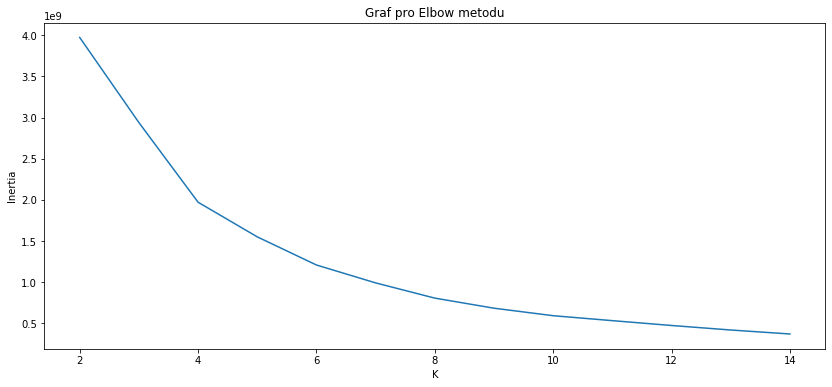

In [7]:
wcss = {}
models = {}
for k in range(2, 15):
    models[k] = KMeans(n_clusters=k,algorithm='auto', max_iter=200)
    models[k].fit(rfm_df[['recency', 'frequency','monetary']])
    wcss[k] = models[k].inertia_ 
    
fig, ax = plt.subplots(figsize=(14, 6))
ax.plot(list(wcss.keys()), list(wcss.values()));
ax.set_xlabel('K');
ax.set_ylabel('Inertia');
ax.set_title("Graf pro Elbow metodu");

Inertia je suma čtverců vzdáleností bodů k jejich nejbližšímu centru (průměru clusteru). Chceme tedy, aby hodnota byla "malá" , ale zároveň nedocházelo ke zbytečnému dělení clusterů na "podskupiny". Z grafu vidíme, že v okolí 6 dochází k  jemnějším přechodům, ale zase ne k takovým přechodům aby docházelo k detailnějšímu dělení clusteru.

Podívejme se detailněji na clustery v okolí 6

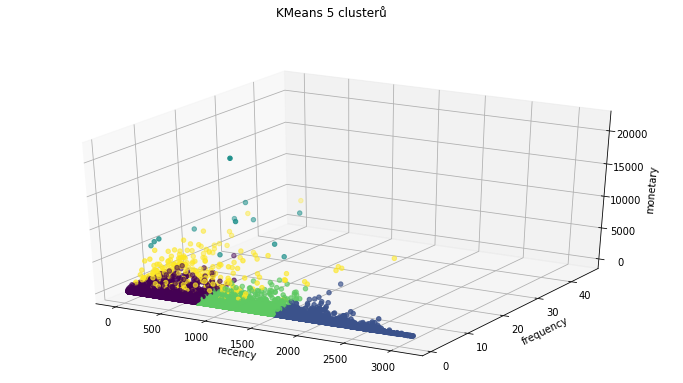

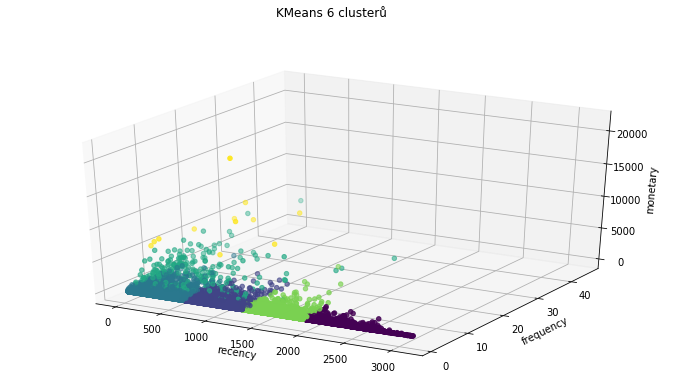

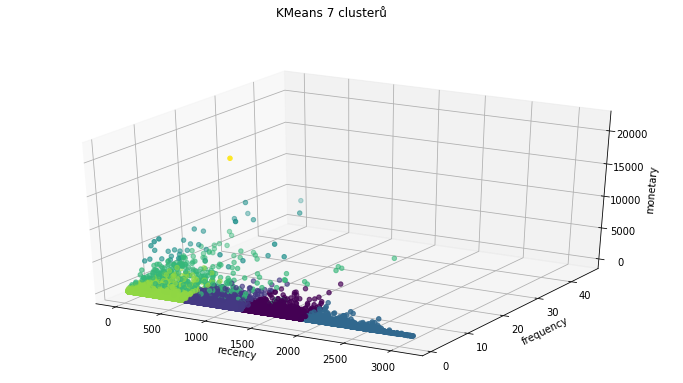

In [8]:
for x in range(5, 8):
        kms = models[x]
        rfm_df['cat'] = kms.predict(rfm_df[['recency', 'frequency','monetary']])
        fig = plt.figure(figsize=(12,6))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(rfm_df['recency'],rfm_df['frequency'], rfm_df['monetary'], c=rfm_df['cat'])
        ax.set_xlabel('recency')
        ax.set_ylabel('frequency')
        ax.set_zlabel('monetary')
        fig.suptitle('KMeans {} clusterů'.format(x))
        
        plt.show()

Podle scatter plotu je vidět, že rozdíl mezi _K=6_ a _K=7_ je mdlý. Ve výsledku došklo k přesunutí pár bodů do jiného clusteru a vytvoření samostatného clusteru pro izolovaný bod s vysokým skóre. Co se týče rozdílu mezi K=6 a K=5 došlo k zjemnění rozdělení podle **recency**, tedy máme detailnější přehled o tom, kteří v eshopu nakupovali v poslední roce a čtvrt, což je podle mě pro business a customer targeting důležitější než celé dva roky.

Pokud bychom zvolili _K=7_ jeden celý cluster by tvořil zákazník s největčí monetary (viz. tmavě zelený v posledním grafu), jedna možnost by byla zákazníka izolovat z predikce modelu jako samostatný cluster, protože pro _K~6_ bude vždy buď sám jediný v clusteru (kvůli velké vzdálenosti) nebo na sebe nabalí zákazníky s větší monetary (díky menší vzdálenosti). Rozhodl jsem se zákazníka ponechat, protože ve výsledku dostaneme pestřejší rozdělení do clusterů, respektivě odizoluji zákazníky s "velkou" monetary.

In [9]:
final_choice = 6

In [10]:
rfm_df['cat'] = models[final_choice].predict(rfm_df[['recency', 'frequency','monetary']])
rfm_df['cat'] = rfm_df['cat'].astype('category')
lab={'cat_s' : 'cluster'} 
order={str(k):k for k in range(0, 12)}

In [11]:
fig = px.scatter_3d(rfm_df, x='recency', y='frequency', z='monetary', color='cat', hover_name='id', title="Segmentace {0} clusterů".format(final_choice), labels=lab, category_orders=order)
fig.show()

# 📊Transformace dat
Dalším problémem je fakt, že data velice tíhnou k malé frequency což se na grafu projevuje horší čitelností. Podíváme se jestli by nám s tím mohla pomoct standardizace.

In [12]:
rfm_df['recency_s'] = rfm_df['frequency_s'] = rfm_df['monetary_s'] = None 
rfm_df[['recency_s', 'frequency_s', 'monetary_s']] = StandardScaler().fit_transform(rfm_df[['recency', 'frequency', 'monetary']])

In [13]:
kms = KMeans(n_clusters=final_choice,n_init=200, algorithm='elkan', precompute_distances='auto', random_state=42, max_iter=25)
kms.fit(rfm_df[['recency_s', 'frequency_s','monetary_s']])
lab.update({'monetary_s': "Standardizovaná monetary", 'frequency_s': "Standardizovaná frequency",'recency_s': "Standardizovaná recency",  })
rfm_df['cat_s'] = kms.predict(rfm_df[['recency_s', 'frequency_s','monetary_s']])
rfm_df['cat_num'] = rfm_df['cat_s'].astype('category')
rfm_df['cat_s'] = rfm_df['cat_s'].astype('category')

In [14]:
fig = px.scatter_3d(rfm_df, x='recency_s', y='frequency_s', z='monetary_s', color='cat_s', hover_name='id', title="Segmentace {0} clusterů pro standardizované příznaky".format(final_choice), labels=lab, category_orders=order)
fig.show()

Je vidět, že ani po standardizaci se nezbavíme segmentů "nalepených" na ose pro recency.

# 🛍️ Kategorizace zákazníků

Můžeme se ještě podívat jak jednotlivé clustery vypadají

In [15]:
px.histogram(rfm_df, title="Průměrná poslední návštěva", x='cat_s',y='recency', color="cat_s", log_y=True, histfunc='avg', height=300, labels=lab, category_orders=order).show()
px.histogram(rfm_df, title="Průměrná pravidelnost", x='cat_s',y='frequency', color="cat_s", log_y=True, histfunc='avg', height=300, labels=lab, category_orders=order).show()
px.histogram(rfm_df, title="Průměrná útrata", x='cat_s',y='monetary', color="cat_s", log_y=True, histfunc='avg', height=300, labels=lab, category_orders=order).show()
px.histogram(rfm_df, title="Počet zákazníků", x='cat_s',y='cat_s', color="cat_s", histfunc='count', log_y=True, height=300, labels=lab, category_orders=order).show()

In [16]:
from sklearn.preprocessing import MinMaxScaler
tmp_rfm = rfm_df.copy(deep=True)
tmp_rfm = tmp_rfm[['recency', 'frequency', 'monetary', 'cat_s']].groupby('cat_s').mean()
lab.update({'value':"Střední hodnota normy", 'attrib':'příznak'})
tmp_rfm[['recency', 'frequency', 'monetary']] = MinMaxScaler().fit_transform(tmp_rfm[['recency', 'frequency', 'monetary']])
dm = pd.melt(tmp_rfm.reset_index(), id_vars=[ 'cat_s'], value_vars=['recency', 'frequency', 'monetary'], var_name="attrib", value_name="value")

V praxi se používá tzv. SnakePlot, který zobrazuje střední hodnotu příznaků pro daný cluster, s tím že pokud data znormalizujeme, je celkem snadné z grafu finální vlastnosti odhadnout.

In [17]:
px.line(dm, x="attrib", y="value", color='cat_s', labels=lab, height=400,  category_orders=order).show();

## 🔍 Pokud všechny tyto informace dáme dohromady

<div>
<span style="color: #19d3f3; font-size: 20px">Cluster 5</span>
<div>Je skupina lidí, kteří v e-shopu před nakupovali před delší dobou, méněkrát a za malou částku.</div>
    Tuto skupinu bych označil za: <strong>Nezajímavou</strong>
</div>

<div>
<span style="color: #ef553b; font-size: 20px">Cluster 1</span>
<div>Je obdoba clusteru 5 s jediným rozdílem v tom, že tato skupina měla záznamy se starším datem než cluster 5.</div>
    Tuto skupinu bych označil za: <strong>Nezajímavou</strong>
</div>

<div>
<span style="color: #636efa; font-size: 20px">Cluster 0</span>
<div>Tento cluster obsahuje zákazníky s malým R-score, ale malým F a M skóre. Pokud se ale podíváme na počet zákazníků ve skupině (viz. graf nahoře). S největší pravděpodobností v této skupině (jelikož recency je malá) je potenciálně hodně zákazníků, kteří by do budoucna mohli znovu nakupovat v tomto e-shopu, takže pomocí např. slevových kupónů by se dal zvětšit počet nákupů v budoucnu.</div>
    Tuto skupinu bych označil za: <strong>Stojí za investici</strong>
</div>

<div>
<span style="color: #00cc96; font-size: 20px">Cluster 2</span>
<div>V tomto clusteru se nacházejí podobní zákazníci jako v clusteru 0. Tito zákazníci však nakoupili už vícekrát, tudíž byli s jejich posledními nákupy spokojeni a business vedení e-shopu by podle mě mělo cítit potřebu si tyto zákazníky udržet.</div>
    Tuto skupinu bych označil za: <strong>Stojí za udržení</strong>
</div>

<div>
<span style="color: #ab63fa; font-size: 20px">Cluster 3</span><span style="font-size: 20px"> &amp; </span><span style="color: #fea15a; font-size: 20px">Cluster 4</span> 
<div>Bych označil za nejzajímavější skupiny, jelikož mají obě nízkou recency a vysokou frekvenci. Liší se tedy jenom v monetary (jeden velkou a jeden větší než clustery 5/1/0).</div> 
 <div>V clusteru s číslem 3 je však o poznání méně zákazníků, může se jednat například o firmy.</div>
    Tyto skupinu bych označil za: <strong>SuperStars</strong>
</div>

#  📑 alternativní RFM 

In [18]:
from dateutil.relativedelta import relativedelta
yr_before = today - relativedelta(months=12)
print("Dnes: {0}".format(today))
print("Před rokem bylo: {0}".format(yr_before))

Dnes: 2015-12-19 00:00:00
Před rokem bylo: 2014-12-19 00:00:00


### 🗄️ Vytvoření datasetu

Vytvoření datasetu pro tuto metodu RFM je oproti základní složitější a časově složitější.

In [19]:
rfm_dict = {}

In [20]:
def RFM_v2(row):
    
    cid = row['Customer ID']
    if cid not in rfm_dict.keys():
        rfm_dict[cid] = {}
    
    # recency
    m_diff = (today.year*12 + today.month) - (row['Date'].year*12 + row['Date'].month) 
    if 'recency' not in rfm_dict[cid]:
        rfm_dict[cid]['recency'] = max(m_diff, 1)
    else:
        #print('Mdiff '+str(today) +str( row['Date'] )+'=='+str(m_diff))
        rfm_dict[cid]['recency'] = max(min(m_diff, rfm_dict[cid]['recency']), 1)
    
    # monetary
    if 'monetary' not in rfm_dict[cid]:
        rfm_dict[cid].update({'monetary': max(row['Subtotal'], 1)})
    else:
        rfm_dict[cid]['monetary'] = max(row['Subtotal'], rfm_dict[cid]['monetary']) 
    
    # frequency
    if 'frequency' not in rfm_dict[cid]:
        rfm_dict[cid].update({'frequency': 0 if row['Date'] < yr_before else 1})
    else:
        rfm_dict[cid]['frequency']= max( rfm_dict[cid]['frequency'] + (0 if row['Date'] < yr_before else 1) , 0)


In [21]:
df.apply(lambda x: RFM_v2(x), axis=1);
for x in rfm_dict.keys():
    rfm_dict[x]['frequency'] = max(rfm_dict[x]['frequency'], 1)

Dataset je připravený, teď se znovu podíváme co nám řekne Elbow metoda 🦖

In [22]:
alt_RFM_df = pd.DataFrame.from_dict(rfm_dict, orient='index').reset_index()

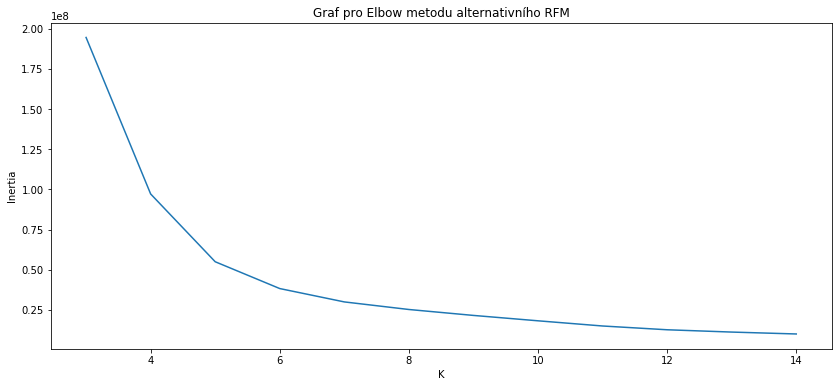

In [23]:
wcss = {}
models = {}
for k in range(3, 15):
    models[k] = KMeans(n_clusters=k,algorithm='auto', max_iter=200, random_state=42)
    models[k].fit(alt_RFM_df[['recency', 'frequency','monetary']])
    wcss[k] = models[k].inertia_ 
    
fig, ax = plt.subplots(figsize=(14, 6))
ax.plot(list(wcss.keys()), list(wcss.values()));
ax.set_xlabel('K');
ax.set_ylabel('Inertia');
ax.set_title("Graf pro Elbow metodu alternativního RFM");

Vypadá to, že počet clusterů by mohl být podobný jako v předchozím případě.

In [24]:
final_choice_2 = 6

In [25]:
alt_RFM_df['cat'] = models[final_choice_2].predict(alt_RFM_df[['recency', 'frequency','monetary']])
alt_RFM_df['cat'] = alt_RFM_df['cat'].astype('category')
fig = px.scatter_3d(alt_RFM_df, x='recency', y='frequency', z='monetary', color='cat', hover_name='index', title="Segmentace {0} clusterů pro standardizované příznaky".format(final_choice), labels=lab, category_orders=order)
fig.show()

Ale grafy jsou chaotické a moc z nich nevyčteme...<br>
Zkusíme tedy znovu standardizaci příznaků

In [26]:
alt_RFM_df['recency_s'] = alt_RFM_df['frequency_s'] = alt_RFM_df['monetary_s'] = None 
alt_RFM_df[['recency_s', 'frequency_s', 'monetary_s']] = StandardScaler().fit_transform(alt_RFM_df[['recency', 'frequency', 'monetary']])

In [27]:
kms = KMeans(n_clusters=6,algorithm='auto', max_iter=200, random_state=42).fit(alt_RFM_df[['recency_s', 'frequency_s','monetary_s']])
alt_RFM_df['cat_s'] = kms.predict(alt_RFM_df[['recency_s', 'frequency_s','monetary_s']])
alt_RFM_df['cat_s'] = alt_RFM_df['cat_s'].astype('category')
fig = px.scatter_3d(alt_RFM_df, x='recency_s', y='frequency_s', z='monetary_s', color='cat_s', hover_name='index', title="Segmentace {0} clusterů pro standardizované příznaky".format(final_choice), labels=lab, category_orders=order)
fig.show()

V tomto grafu už je vidět, že po standardizaci příznaků dostáváme v grafu více separované množiny zákazníků

In [28]:
tmp_rfm = alt_RFM_df.copy(deep=True)
tmp_rfm = tmp_rfm[['recency', 'frequency', 'monetary', 'cat_s']].groupby('cat_s').mean()
lab.update({'value':"Střední hodnota normy", 'attrib':'příznak'})
tmp_rfm[['recency', 'frequency', 'monetary']] = MinMaxScaler().fit_transform(tmp_rfm[['recency', 'frequency', 'monetary']])
dm = pd.melt(tmp_rfm.reset_index(), id_vars=['cat_s'], value_vars=['recency', 'frequency', 'monetary'], var_name="attrib", value_name="value")

In [29]:
px.line(dm, x="attrib", y="value", color='cat_s', labels=lab, height=300, category_orders=order).show();

## 🔍 Identifikace clusterů

<div>
<span style="color: #ab63fa; font-size: 20px">Cluster 3</span>
<div>Zákazníci v tomto clusteru průměrně nakoupili nedávno, nakupují frekventovaně ale za menší částky.</div>
</div>

<div>
<span style="color: #19d3f3; font-size: 20px">Cluster 5</span>
<div>Je skupina lidí, kteří také nakoupili relativně nedávno a nakupují méně frekventovaně než ti z clusteru 5, také však za menší částky. </div>
</div>

<div>
<span style="color: #00cc96; font-size: 20px">Cluster 2</span>
<div>U této skupiny je to déle od posledního nákupu, zároveň s nízkou frekventovaností, ale s velkou monetary. </div>
    Tuto skupinu bych označil za: <strong>Nezajímavou</strong>
</div>

<div>
<span style="color: #636efa; font-size: 20px">Cluster 0</span>
<div>Tento cluster obsahuje zákazníky s malým R-score, ale malým F a M skóre. Pokud se ale podíváme na počet zákazníků ve skupině (viz. graf nahoře). S největší pravděpodobností v této skupině (jelikož recency je malá) je potenciálně hodně zákazníků, kteří by do budoucna mohli znovu nakupovat v tomto e-shopu, takže pomocí např. slevových kupónů by se dal zvětšit počet nákupů v budoucnu.</div>
    Tuto skupinu bych označil za: <strong>Stojí za investici</strong>
</div>

<div>
<span style="color: #ef553b; font-size: 20px">Cluster 1</span>
<div>V tomto clusteru se nacházejí podobní zákazníci jako v clusteru 0. Tito zákazníci však nakoupili už vícekrát, tudíž byli s jejich posledními nákupy spokojeni a business vedení e-shopu by podle mě mělo cítit potřebu si tyto zákazníky udržet.</div>
    Tuto skupinu bych označil za: <strong>Stojí za udržení</strong>
</div>

<div>
    <span style="color: #ffa15a; font-size: 20px">Cluster 3</span>
<div>Bych označil za nejzajímavější skupiny, jelikož mají obě nízkou recency a vysokou frekvenci. Liší se tedy jenom v monetary (jeden velkou a jeden větší než clustery 5/1/0).</div> 
 <div>V clusteru s číslem 3 je však o poznání méně zákazníků, může se jednat například o firmy.</div>
    Tyto skupinu bych označil za: <strong>Superstars</strong>
</div>

In [30]:
first = rfm_df[['id', 'recency', 'frequency', 'monetary', 'cat_s']]
second = alt_RFM_df[['index', 'recency', 'frequency', 'monetary', 'cat_s']].rename(mapper={'index':'id'}, axis=1)
df_comp = pd.merge(first, second, left_on='id', right_on='id', how='inner', suffixes=('_classic', '_new'))
labels = [x+str(y) for x in ['Původní ', 'Nový '] for y in range(0, 6)]
colors = [x for x in ['#2ecc71', '#3498db'] for y in range(0, 6) ]
groupped = df_comp[['id', 'cat_s_classic', 'cat_s_new']].groupby(['cat_s_classic', 'cat_s_new']).count().dropna().reset_index()

In [31]:
source = []
target = []
value = []

for index, row in groupped.iterrows():
    source.append(row['cat_s_classic'])
    target.append(row['cat_s_new']+6)    
    value.append(row['id']) 

In [32]:
import plotly.graph_objects as go
fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 10,
      thickness = 12,
      label = labels,
      color = colors
    ),
    
    link = dict(
      source = source,
      target = target,
      value = value,
    color = "#E7EAEF",
  ))])

fig.update_layout(title_text="Customer Share diagram pro klasické a alternativní RFM", font_size=15)
fig.show()

Z grafu je vidět, že se rozložení zákazníků v clusterech jednotlivých modelů liší, takže vlastně u každé metody cílíme na trochu jinou skupinu lidí. V alternativním přístupu počítáme s maximální útratou, což ale nemusí být směrodatné, například pokud máme menší skupinu lidí. Například pokud bychom srovnávali malou skupinu lidí, kteří nakupují průměrně za malé částky, ale například na Vánoce si udělají radost a koupí televizi za 60k vyskočí tento zákazník v alternativním přístupu jako zajímavější, ale už nebere v potaz to, že tento zákazník si v příštím roce nemusí nic koupit (třeba proto, že bude splácet půjčku na televizi, což je v česku celkem běžné). 

# Po dvou týdnech mi došlo..
že jsem si vlastně špatně zinterpretoval výsledek pokusu po logaritmizaci dat, takže jsem to jenom znovu přidal.. <br>Takže po pouhém logaritmování bychom dostali následující clustery

In [33]:
log_df = rfm_df[['id', 'recency', 'frequency', 'monetary', 'cat', 'cat_s']].copy(deep=True)

In [34]:
log_df['recency_l'] = np.log(log_df['recency'])
log_df['frequency_l'] = np.log(log_df['frequency'])
log_df['monetary_l'] = np.log(log_df['monetary'])

In [35]:
lkms = KMeans(n_clusters=final_choice,n_init=200, algorithm='elkan', precompute_distances='auto', random_state=42, max_iter=2)
log_df['cat_l'] = lkms.fit_predict(log_df[['recency_l', 'frequency_l', 'monetary_l']])
log_df['cat_l'] = log_df['cat_l'].astype('category')  


In [36]:
fig = px.scatter_3d(log_df, x='recency_l', y='frequency_l', z='monetary_l', color='cat_l', hover_name='id', title="Segmentace {0} clusterů pro logaritmováné příznaky".format(final_choice), labels=lab, category_orders=order)
fig.show()

In [37]:
llabels = [x+str(y) for x in ['Původní ', 'Log '] for y in range(0, 6)]
lcolors = [x for x in ['#2ecc71', '#8e44ad'] for y in range(0, 6) ]

In [38]:
lsource = []
ltarget = []
lvalue = []

for index, row in log_df.iterrows():
    lsource.append(row['cat'])
    ltarget.append(row['cat_l']+6)    
    lvalue.append(row['id']) 

In [39]:
fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 10,
      thickness = 12,
      label = llabels,
      color = lcolors
    ),
    
    link = dict(
      source = lsource,
      target = ltarget,
      value = lvalue,
    color = "#E7EAEF",
  ))])

fig.update_layout(title_text="Customer Share diagram pro původní a logaritmované příznaky", font_size=15)
fig.show()

Logaritmování samozřejmě zamíchá vzdálenostmi mezi jednotlivými body (zmenší jí), takže dojde k tomu, že outlieři budou blíže k ostatním skupinám, což zmenší původní velké clustery a zvětší původní malé clustery. <br> Po logaritmování nám ale pořád zůstává ten problém nerovnoměrného rozdělení dat, podíváme se tedy na to, jestli nám pomůže standardizace.

In [40]:
log_df['recency_ls'] = log_df['frequency_ls'] = log_df['monetary_ls'] = None
log_df[['recency_ls', 'frequency_ls', 'monetary_ls']] = MinMaxScaler().fit_transform(log_df[['recency_l', 'frequency_l', 'monetary_l']])
lkmss = KMeans(n_clusters=final_choice, n_init=200, algorithm='elkan', precompute_distances='auto', random_state=42, max_iter=2)
log_df['cat_ls'] = lkms.fit_predict(log_df[['recency_ls', 'frequency_ls', 'monetary_ls']])
log_df['cat_ls'] = log_df['cat_ls'].astype('category')  

In [41]:
lab2 = dict(lab)
lab2.update({'cat_ls': 'cluster', 'recency_ls': 'log std recency', 'frequency_ls':'log std frequency', 'monetary_ls':'log std monetary'})

In [42]:
fig = px.scatter_3d(log_df, x='recency_ls', y='frequency_ls', z='monetary_ls', color='cat_ls', hover_name='id', title="Segmentace {0} clusterů pro logaritmováné a standardizované příznaky".format(final_choice), labels=lab2, category_orders=order)
fig.show()

In [43]:
vals = ['recency', 'frequency', 'monetary', 'cat_ls']
mini = ['recency', 'frequency', 'monetary']

In [44]:
tmp_rfm2 = log_df.copy(deep=True)
tmp_rfm2 = tmp_rfm2[vals].groupby('cat_ls').mean()
tmp_rfm2[mini] = MinMaxScaler().fit_transform(tmp_rfm2[mini])

In [45]:
dm1 = pd.melt(tmp_rfm2.reset_index(), id_vars=['cat_ls'], value_vars=mini, var_name="attrib", value_name="value")
px.line(dm1, x="attrib", y="value", color='cat_ls', labels=lab2, height=300, category_orders=order).show();

Podle snake plotu to vypadá, že naši noví Superstar zákazníci jsou z nového clusteru 3, jelikož má velkou monetary, frequency a nizkou recency.

In [46]:
lssource = []
lstarget = []
lsvalue = []

lslabels = [x+str(y) for x in ['Původní ', 'Log std '] for y in range(0, 6)]
lscolors = [x for x in ['#2ecc71', '#e74c3c'] for y in range(0, 6) ]

for index, row in log_df.iterrows():
    lssource.append(row['cat'])
    lstarget.append(row['cat_ls']+6)    
    lsvalue.append(row['id']) 

In [47]:
fig = go.Figure(data=[go.Sankey(
    orientation = "h",
    node = dict(
      pad = 10,
      thickness = 12,
      label = lslabels,
      line = dict(
        color = "black",
        width = 0.5
      ),
      color = lscolors
    ),
    
    link = dict(
      source = lssource,
      target = lstarget,
      value = lsvalue,
    color = "#E7EAEF",
  ))])

fig.update_layout(title_text="Customer Share diagram pro klacické a logaritmo-standardizované příznaky", font_size=15)
fig.show()